In [2]:
# Import python packages
import xarray as xr #to read file, alter file
import matplotlib as mpl # plotting
import matplotlib.pyplot as plt # plotting

import numpy as np # only needed to run example plots
import math
from datetime import datetime as dt
import time

# Cartopy imports
import cartopy.crs as ccrs # map projections
import cartopy.feature as cfeature # features (eg. borders, lakes)
from cartopy import util as cutil
import cartopy.mpl.ticker as cticker # formatting ticks to be lat/lon

import warnings

In [3]:
# general dataset
path = 'H:/Summer24-25/' # make sure path uses slashes in //// direction (not '\\\')
filename = 'trends_mad_2005_2015.h0.2014-09.nc'
ds = xr.open_dataset(path+filename) # Read in file as dataset

# dataset for iterating by time
path = 'H:/Summer24-25/'
with warnings.catch_warnings(): #ignore warnings --> else gives fill warning bc some empty values
    warnings.simplefilter('ignore')
    ds_ozone = xr.open_dataset(path+'o3_Amon_CESM2-WACCM_ssp126.nc')

# dataset for using vectors (eg. quiver plots/stream plots)
path = 'H:/Summer24-25/'
with warnings.catch_warnings(): #ignore warnings --> else gives fill warning bc some empty values
    warnings.simplefilter('ignore')
    ds_vectors = xr.open_mfdataset(path+'*WACCM-FV2_historical*.nc')

# converting vector and ozone datasets pressure levels to hPa units (instead of Pa)
for dataset in [ds_vectors, ds_ozone]:
    if dataset.plev.attrs['units'] == 'Pa':
        dataset['plev'] = dataset.plev / 100
        dataset.plev.attrs['axis'] = 'Z' # attributes get reset so have to redo them
        dataset.plev.attrs['positive'] = 'down'
        dataset.plev.attrs['standard_name'] = 'air_pressure'
        dataset.plev.attrs['title'] = 'pressure'
        dataset.plev.attrs['type'] = 'double'
        dataset.plev.attrs['units'] = 'hPa'

In [4]:
horiz = [21,14.8]
vertic = [14.8, 21]

''' returns cftime object as string, in format specified'''
def timefmt(timeindex, format='%Y %B'):
    date = dt.strptime(str(ds_ozone.time[timeindex].values), '%Y-%m-%d %H:%M:%S')
    return date.strftime(format)

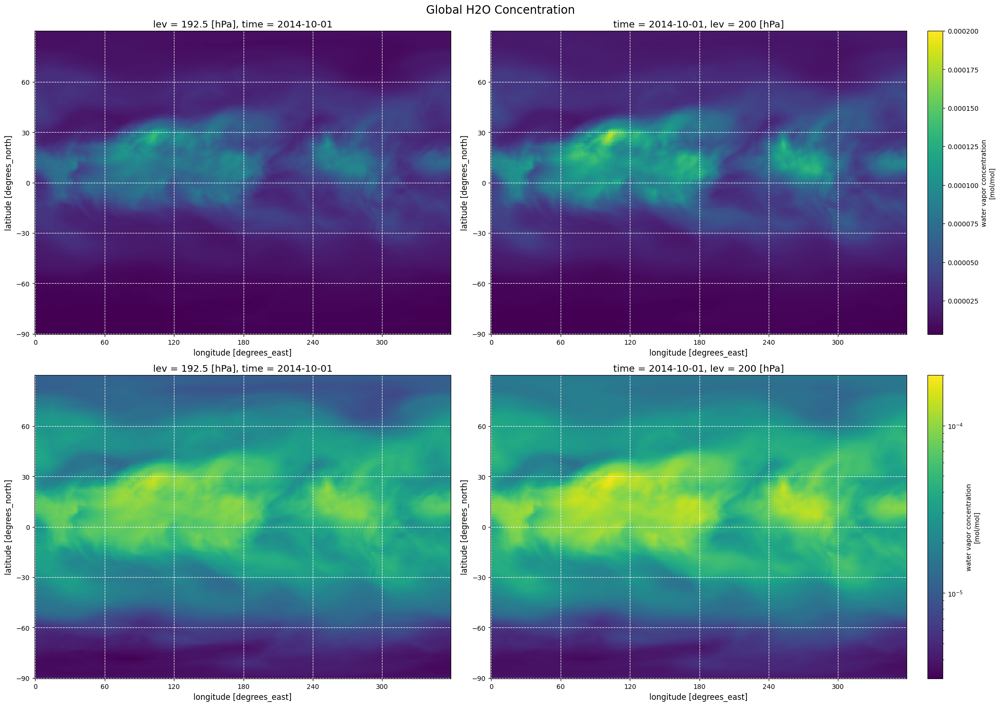

In [232]:
fig,axs = plt.subplots(nrows=2,ncols=2, figsize=horiz, layout='constrained') # 'constrained' layout prevents overlap of labels
fig.suptitle('Global H2O Concentration', size='xx-large')

# Normalising colour map between graphs--> can use different types of normalizing
norm = mpl.colors.Normalize(vmax=0.0002)
lognorm = mpl.colors.LogNorm(vmax=0.0002)

pressure = 200 # (hPa)

# Selection methods
ds.H2O.sel(time='2014-10-30', lev=pressure, method='nearest').plot(ax=axs[0,0], norm=norm, add_colorbar=False)
                                    # sets lev to closest valid value       # remove first colorbar, as second will be identical
ds.H2O.isel(time=0).interp(lev=pressure).plot(ax=axs[0,1], norm=norm) # interpolation to set lev to 200

# same but uses lognorm on colorbar
ds.H2O.sel(time='2014-10-30', lev=pressure, method='nearest').plot(ax=axs[1,0], norm=lognorm, add_colorbar=False)
                                                                            # remove first colorbar, as second will be identical

ds.H2O.isel(time=0).interp(lev=pressure).plot(ax=axs[1,1], norm=lognorm)

for ax in axs.flat:
    ax.set_xticks(np.arange(0,360,60))
    ax.xaxis.label.set_size('large')
    ax.set_yticks(np.arange(-90,90,30))
    ax.yaxis.label.set_size('large')
    ax.title.set_size('x-large')
    ax.grid(c='w', ls='--')

fig.savefig('H2O_viridis')

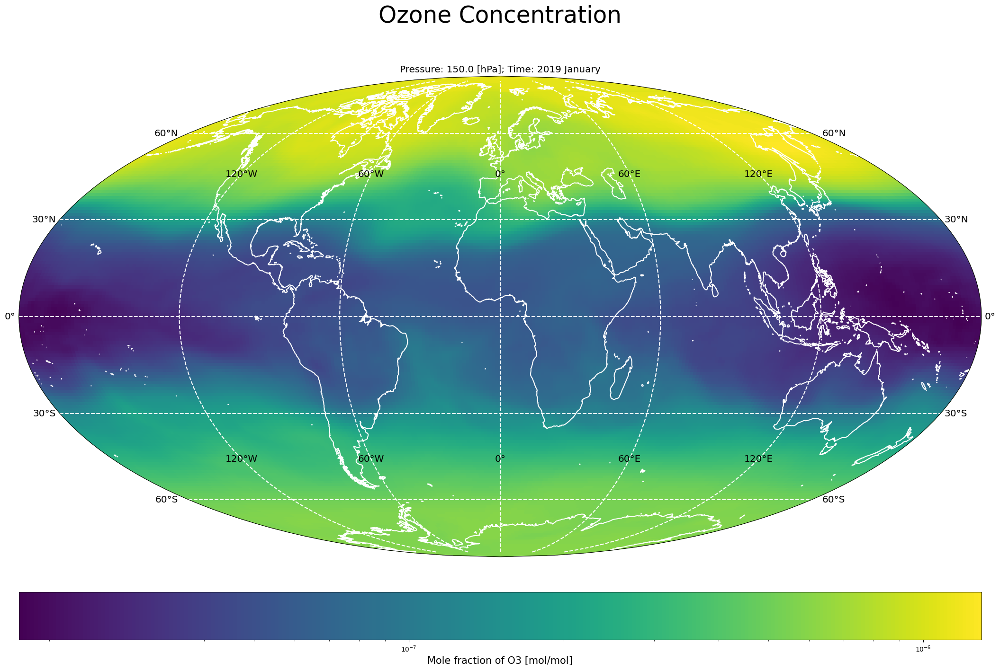

In [145]:
cnorm = mpl.colors.LogNorm()
fig,ax = plt.subplots(figsize=horiz, layout='compressed', subplot_kw={'projection':ccrs.Mollweide()})
fig.suptitle('Ozone Concentration', size='35')
gl = ax.gridlines(draw_labels=True, lw=1.5, color='w', ls='--')
ax.coastlines(resolution='50m', lw=1.5, color='w')
plot = ds_ozone.o3.isel(time=48, plev=10).plot(ax=ax, transform=ccrs.PlateCarree(), norm=cnorm, add_colorbar=False)

cb = fig.colorbar(plot, location='bottom')
cb.set_label(label='Mole fraction of O3 [mol/mol]', size=15)

ax.set_title(label=f'Pressure: {ds_ozone.plev[10].values} [hPa]; Time: {timefmt(48)}', size='x-large')
gl.xlabel_style = {'size': 'x-large'}
gl.ylabel_style = {'size': 'x-large'}
fig.savefig('ozone_mw-viridis')

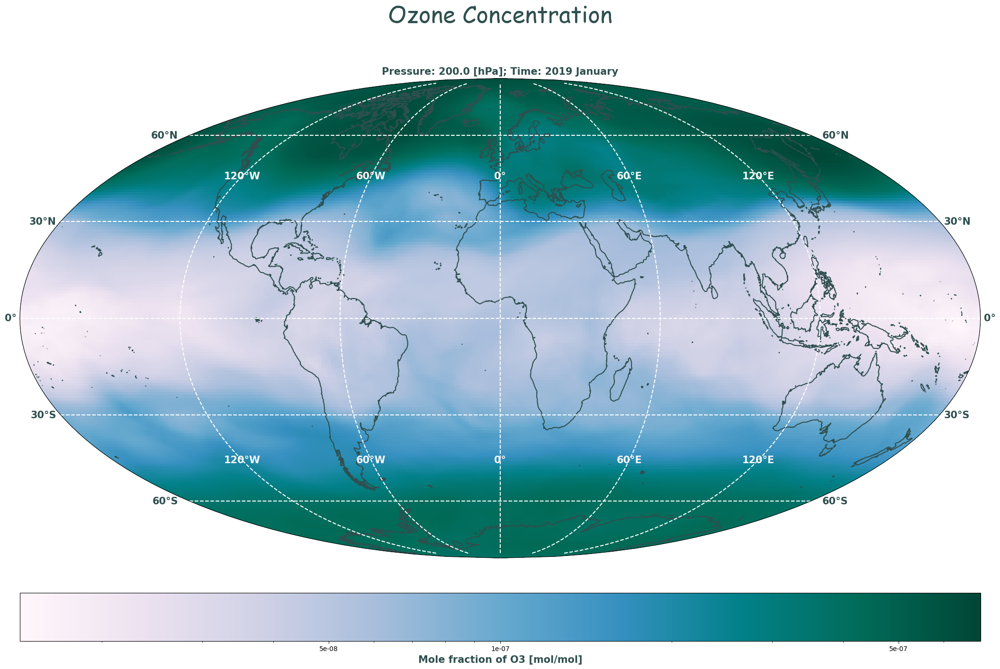

In [210]:
cnorm = mpl.colors.LogNorm()
fig,ax = plt.subplots(figsize=horiz, subplot_kw={'projection':ccrs.Mollweide()}, layout='compressed')

plot = ds_ozone.o3.isel(time=48, plev=9).plot.pcolormesh(ax=ax, transform=ccrs.PlateCarree(), cmap='PuBuGn', norm=cnorm, add_colorbar=False)
cb = fig.colorbar(plot, location='bottom')
cb.set_label(label='Mole fraction of O3 [mol/mol]', size=15, color='darkslategrey', weight='bold')
cb.set_ticks(ticks=[5*10**-8, 10**-7, 5*10**-7], labels=[5*10**-8, 10**-7, 5*10**-7])

fig.suptitle('Ozone Concentration', size=35, font='cursive', c='darkslategrey')
ax.set_title(label=f'Pressure: {ds_ozone.plev[9].values} [hPa]; Time: {timefmt(48)}', size=15, color='darkslategrey', weight='bold')

ax.coastlines(resolution='50m', lw=1.5, color='darkslategrey')
gl = ax.gridlines(draw_labels=True, lw=1.5, color='w', ls='--')
gl.xlabel_style = {'size': 15, 'color': 'whitesmoke', 'weight':'bold'}
gl.ylabel_style = {'size': 15, 'color': 'darkslategrey', 'weight':'bold'}
fig.savefig('ozone_mw-blue')

CPU times: total: 5.11 s
Wall time: 6.28 s


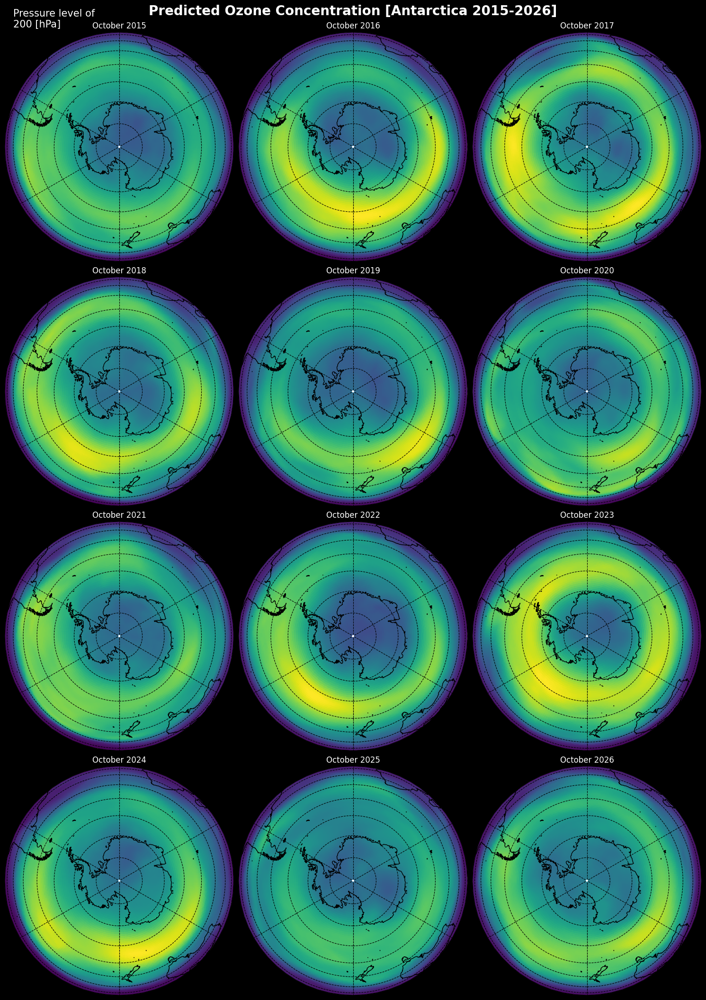

In [141]:
%%time
plt.close('all')
# variable size of subplot grid
times = np.arange(9,12*12+9, 12) # looking for one plot per year, in the 10th month (index 9) --> using ozone data as it has time variable
# times = np.arange(0,12,1)
row,col = math.ceil(len(times)**0.5), round(len(times)**0.5)

fig, axs = plt.subplots(row,col, figsize=vertic, facecolor='k', layout='constrained', subplot_kw=
                        {'projection': ccrs.NearsidePerspective(central_longitude=0.0, central_latitude=-90)})
fig.suptitle('Predicted Ozone Concentration [Antarctica 2015-2026]', size=20, color='w', weight='bold')
fig.text(0.015, 0.975, f'Pressure level of \n{pressure} [hPa]', size=15, color='w')
for i, ax in enumerate(axs.flat):
    if i < len(times):
        g = ds_ozone.o3.isel(time=times[i]).sel(plev=200).plot(ax=ax, transform=ccrs.PlateCarree(), add_colorbar=False)
        ax.set_title(f'{timefmt(times[i], '%B %Y')}', color='w')
        ax.coastlines(resolution='50m', color='k')
        ax.gridlines(color='k', ls='--')
    else:
        ax.remove()

fig.savefig('H:\\Summer24-25\\Jupyter\\ozone_multi-black')

CPU times: total: 5.11 s
Wall time: 6.31 s


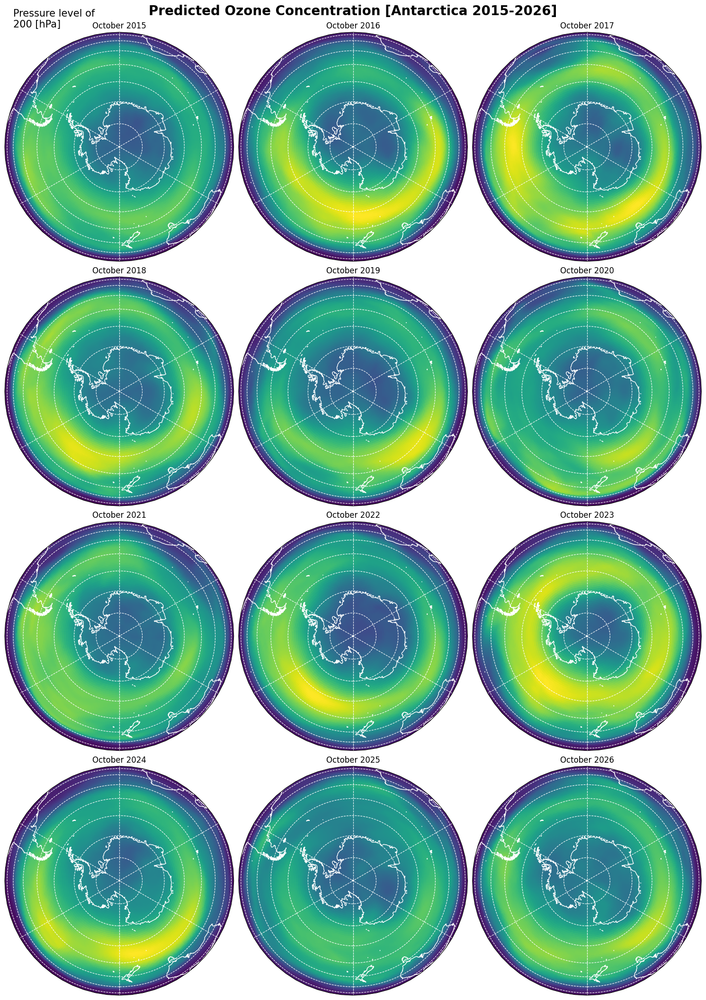

In [142]:
%%time
plt.close('all')
# variable size of subplot grid
times = np.arange(9,12*12+9, 12) # looking for one plot per year, in the 10th month (index 9) --> using ozone data as it has time variable
# times = np.arange(0,12,1)
row,col = math.ceil(len(times)**0.5), round(len(times)**0.5)

fig, axs = plt.subplots(row,col, figsize=vertic, layout='constrained', subplot_kw=
                        {'projection': ccrs.NearsidePerspective(central_longitude=0.0, central_latitude=-90)})
fig.suptitle('Predicted Ozone Concentration [Antarctica 2015-2026]', size=20, weight='bold')
fig.text(0.015, 0.975, f'Pressure level of \n{pressure} [hPa]', size=15)
for i, ax in enumerate(axs.flat):
    if i < len(times):
        g = ds_ozone.o3.isel(time=times[i]).sel(plev=200).plot(ax=ax, transform=ccrs.PlateCarree(), cmap='viridis', add_colorbar=False)
        ax.set_title(f'{timefmt(times[i], '%B %Y')}')
        ax.coastlines(resolution='50m', color='w')
        ax.gridlines(color='w', ls='--')
    else:
        ax.remove()

fig.savefig('H:\\Summer24-25\\Jupyter\\ozone_multi-white')

CPU times: total: 5.06 s
Wall time: 6.28 s


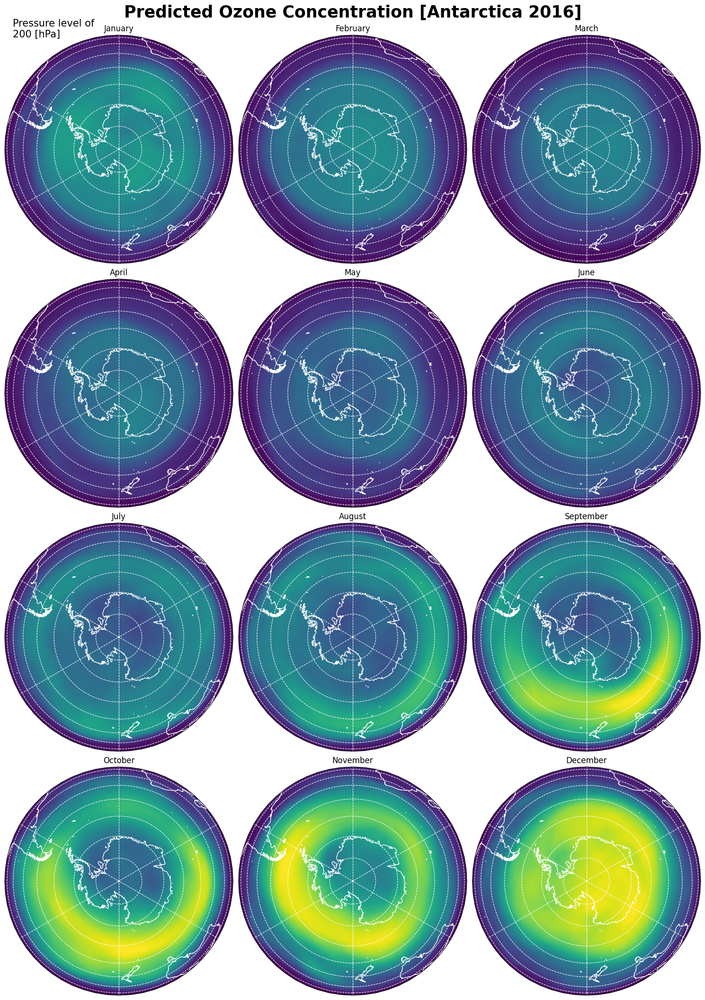

In [133]:
%%time
plt.close('all')
# variable size of subplot grid
# times = np.arange(9,12*12+9, 12) # looking for one plot per year, in the 10th month (index 9) --> using ozone data as it has time variable
times = np.arange(12,24,1)
pressure = 200
data = ds_ozone.o3.sel(plev=pressure)
row,col = math.ceil(len(times)**0.5), round(len(times)**0.5)

fig, axs = plt.subplots(row,col, figsize=vertic, layout='constrained', subplot_kw=
                        {'projection': ccrs.NearsidePerspective(central_longitude=0.0, central_latitude=-90)})

fig.suptitle('Predicted Ozone Concentration [Antarctica 2016]', size=25, weight='bold')
fig.text(0.015, 0.965, f'Pressure level of \n{pressure} [hPa]', size=15)

for i, ax in enumerate(axs.flat):
    if i < len(times):
        g = data.isel(time=times[i]).plot(ax=ax, transform=ccrs.PlateCarree(), cmap='viridis', add_colorbar=False)
        ax.set_title(f'{timefmt(times[i], '%B')}')
        ax.coastlines(resolution='50m', color='w')
        ax.gridlines(color='w', ls='--')
    else:
        ax.remove()

fig.savefig('H:\\Summer24-25\\Jupyter\\ozone_year-white')

CPU times: total: 1.08 s
Wall time: 1.39 s


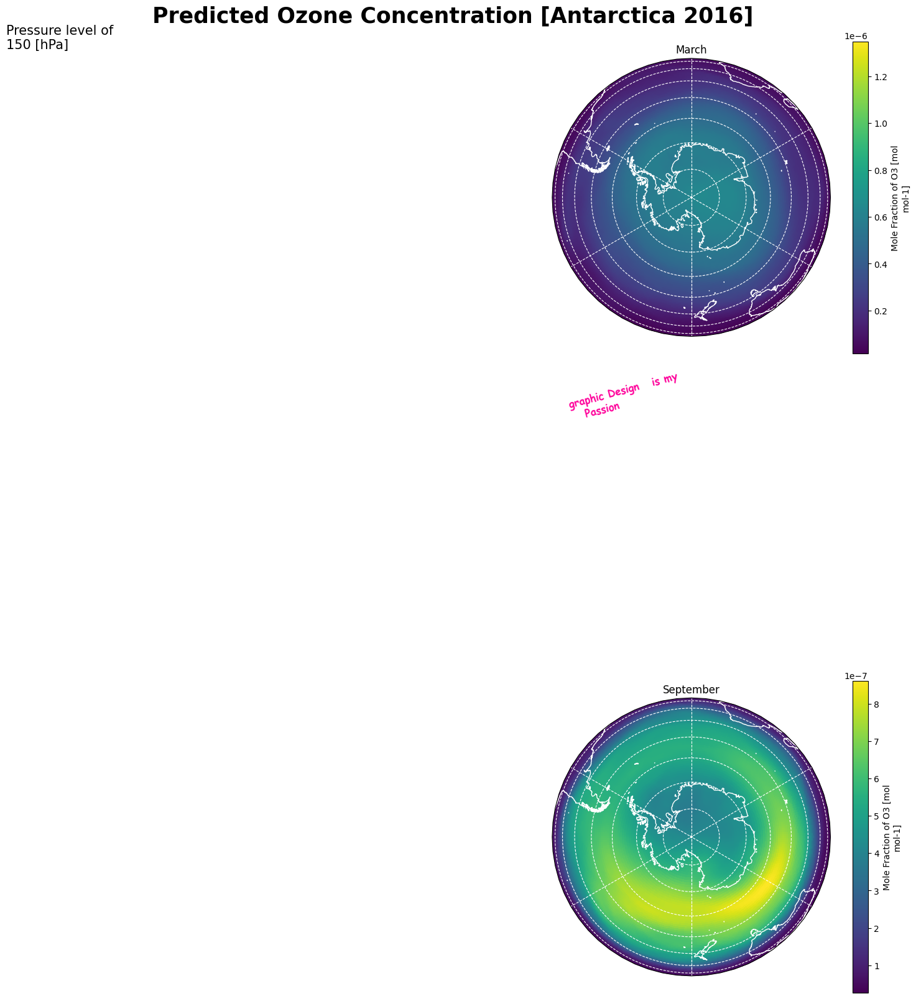

In [268]:
%%time
plt.close('all')
# variable size of subplot grid
# times = np.arange(9,12*12+9, 12) # looking for one plot per year, in the 10th month (index 9) --> using ozone data as it has time variable
times = np.arange(12,24,1)
pressure = 150
data = ds_ozone.o3.sel(plev=pressure)
row,col = math.ceil(len(times)**0.5), round(len(times)**0.5)

fig, axs = plt.subplots(row,col, figsize=vertic, layout='constrained', subplot_kw=
                        {'projection': ccrs.NearsidePerspective(central_longitude=0.0, central_latitude=-90)})

fig.suptitle('Predicted Ozone Concentration [Antarctica 2016]', size=25, weight='bold')
fig.text(0.015, 0.965, f'Pressure level of \n{pressure} [hPa]', size=15)

for i, ax in enumerate(axs.flat):
    if i==2 or i==8:# < len(times):
        g = data.isel(time=times[i]).plot(ax=ax, transform=ccrs.PlateCarree(), cmap='viridis')#, add_colorbar=False)
        ax.set_title(f'{timefmt(times[i], '%B')}')
        ax.coastlines(resolution='50m', color='w')
        ax.gridlines(color='w', ls='--')
    else:
        ax.remove()
fig.text(0.625, 0.68, 'graphic Design   is my\n   Passion', c='xkcd:neon pink', font='cursive', weight='bold', size=12, rotation=15)

fig.savefig('H:\\Summer24-25\\Jupyter\\ozone_year-graphic')

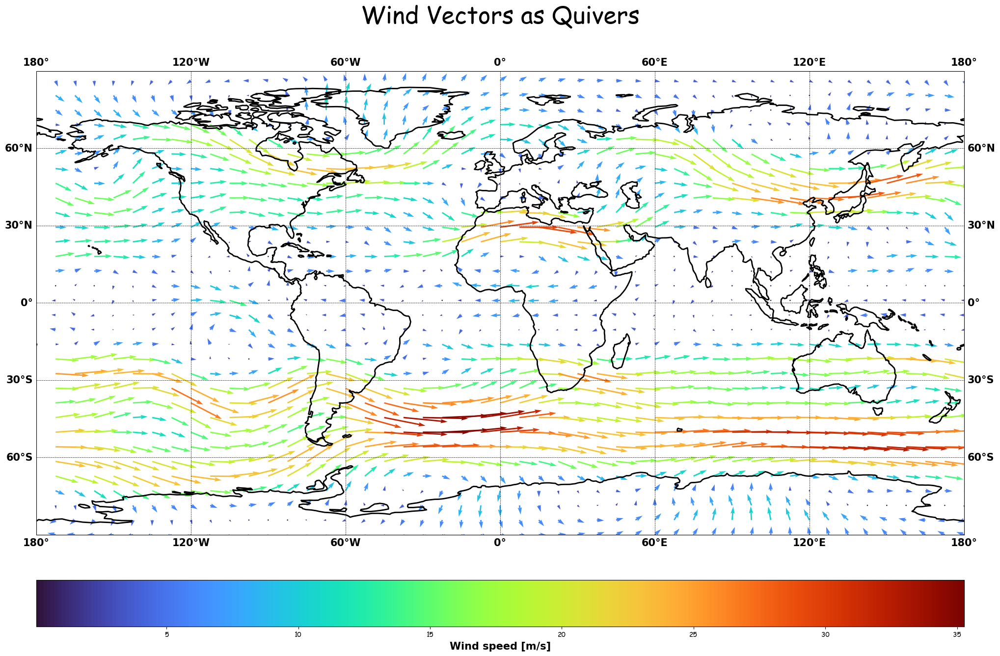

In [259]:
data = ds_vectors.isel(plev=6, time=100)
fig,ax = plt.subplots(figsize=horiz, subplot_kw=
                     {'projection':ccrs.PlateCarree()})
fig.subplots_adjust(bottom=0, top=1.25, left=0.05, right=0.95)
fig.suptitle('Wind Vectors as Quivers', size=35, font='cursive')
u = data.ua[::3, ::3]
v = data.va[::3, ::3]
windspeed = (v**2 + u**2)**0.5

qv = ax.quiver(u.lon, u.lat, u, v, windspeed, cmap='turbo', transform=ccrs.PlateCarree(), scale=700, width=0.0015)
cb = fig.colorbar(qv, location='bottom', pad=0.05)
cb.set_label(label='Wind speed [m/s]', size=15, weight='bold')
cb.set_ticks(ticks=[5, 10, 15, 20, 25, 30, 35], labels=[5, 10, 15, 20, 25, 30, 35], size=15, font='cursive')

ax.coastlines(color='k', lw=2)
gl = ax.gridlines(draw_labels=True, color='k', lw=0.5, ls='--')
gl.xlabel_style = {'size': 15, 'weight':'bold', }
gl.ylabel_style = {'size': 15, 'weight':'bold'}

fig.savefig('vectors-rainbow')